In [1]:
# Initialization Cell
%reset -f
print("Environment cleared. Starting fresh.")

# Imports
import sys
from google.colab import drive
import pyarrow.parquet as pq
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Mount Google Drive , script import etc
drive.mount('/content/drive', force_remount=True)
sys.path.append('/content/drive/MyDrive/da_py_scripts')

# import custom eda module
from eda_pipeline import EDAPipeline

Environment cleared. Starting fresh.
Mounted at /content/drive


In [2]:
# file path
ping_file_path = '/content/drive/MyDrive/latency_project_dataset/df_original.parquet'


# load the parquet file and cast into pandas dataframe, reset index

df = pd.read_parquet(ping_file_path)

df.head()

,timestamp,src_addr,dst_addr,sent,rcvd,dup,min,max,avg,src_continent,...,dst_is_proxy,dst_is_vpn,dst_is_tor,dst_is_tor_exit,hop_count,distance_km,src_prefix_8,src_prefix_16,dst_prefix_8,dst_prefix_16
0,2026-05-18 00:46:19,23.136.232.51,212.72.236.67,3,3,0,152.217935,157.251229,153.961698,North America,...,False,False,False,False,14.0,9002.230167,23,23.136,212,212.72
1,2026-05-18 00:02:37,66.255.252.225,176.74.17.75,3,3,0,107.975190,108.086128,108.037512,North America,...,False,False,False,False,9.0,6508.364048,66,66.255,176,176.74
2,2026-05-18 00:33:58,103.225.148.38,212.51.187.100,3,3,0,191.914408,192.149385,192.025395,Asia,...,False,False,False,False,11.0,11307.960880,103,103.225,212,212.51
3,2026-05-18 00:42:07,156.154.180.254,45.131.252.71,3,3,0,199.786828,199.954054,199.874229,Asia,...,False,False,False,False,17.0,9246.044785,156,156.154,45,45.131
4,2026-05-18 00:22:18,31.3.155.41,5.199.167.27,3,3,0,181.463680,181.712589,181.548289,Europe,...,False,False,False,False,13.0,9645.088719,31,31.3,5,5.199


# The Generalized EDA

The following script performes some generailzed EDA like datatype/ missing value detection, finding some patterns between the target variable and the features.

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                     🚀 EDA Script for Initial Analysis Started !                    
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
DATASET OVERVIEW
Shape: (1116767, 41)
Number of rows: 1116767
Number of columns: 41

Columns:
------------------------------
['timestamp',
 'src_addr',
 'dst_addr',
 'sent',
 'rcvd',
 'dup',
 'min',
 'max',
 'avg',
 'src_continent',
 'src_country',
 'src_longitude',
 'src_latitude',
 'src_asn',
 'src_conn_type',
 'src_provider',
 'src_is_mobile',
 'src_is_cloud_provider',
 'src_is_proxy',
 'src_is_vpn',
 'src_is_tor',
 'src_is_tor_exit',
 'dst_continent',
 'dst_country',
 'dst_longitude',
 'dst_latitude',
 'dst_asn',
 'dst_conn_type',
 'dst_provider',
 'dst_is_mobile',
 'dst_is_cloud_provider',
 'dst_is_proxy',
 'dst_is_vpn',
 'dst_is_tor',
 'dst_is_tor_exit',
 'hop_count',
 'distance_km',
 'src_prefix_8',
 'src_prefix_16',
 'dst_prefix_8',
 '

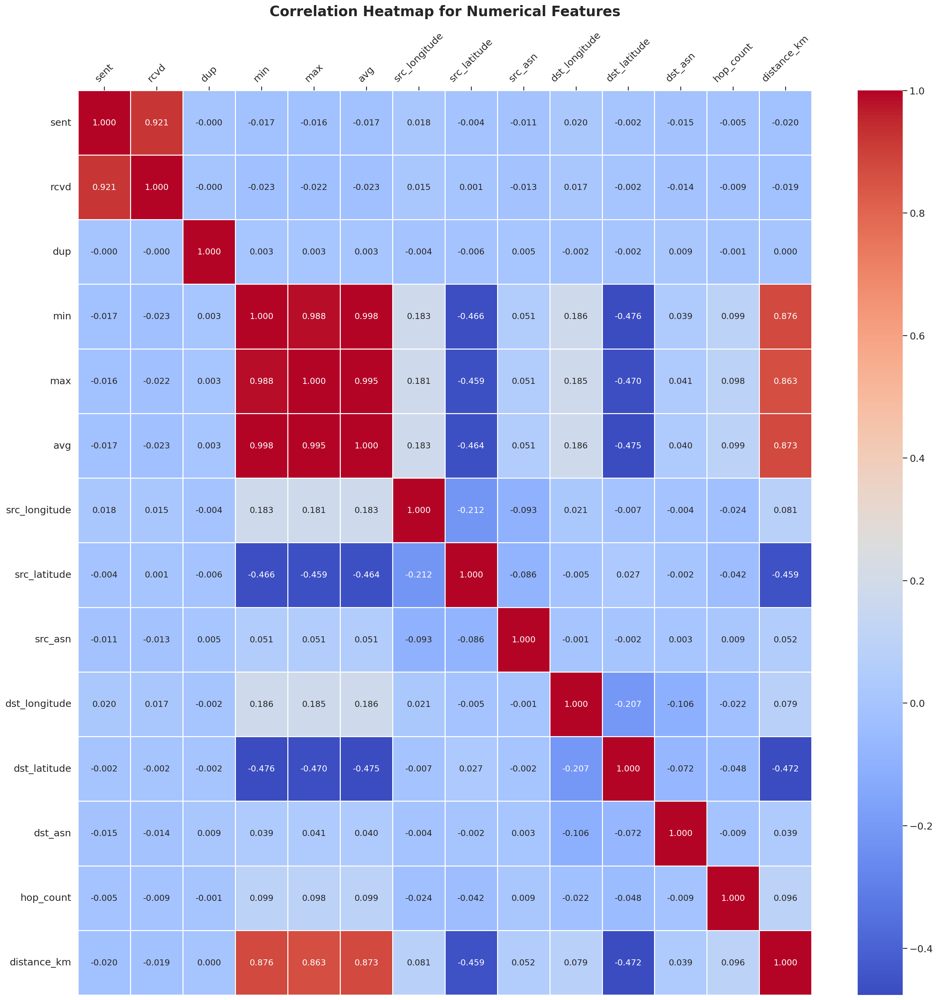



                    📊 Showing Distribution Plots...                     
('Showing Distribution Plots for : dup, min, max, avg, src_longitude, '
 'src_latitude, src_asn, dst_longitude, dst_latitude, dst_asn, hop_count, '
 'distance_km')


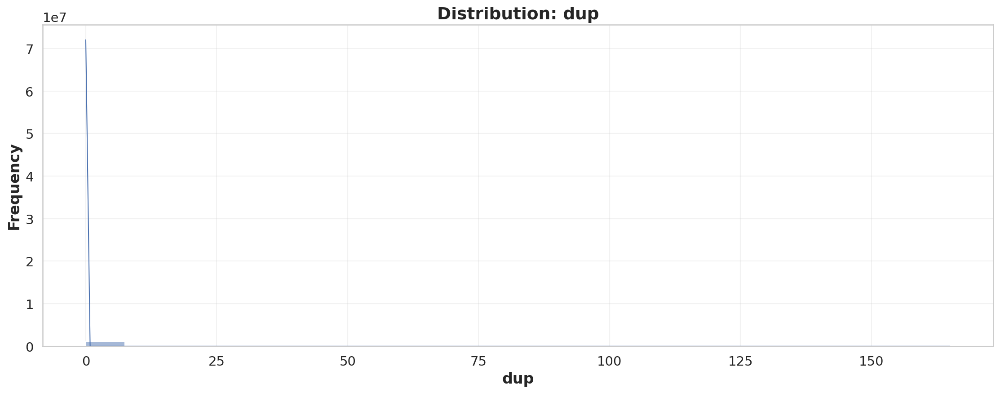

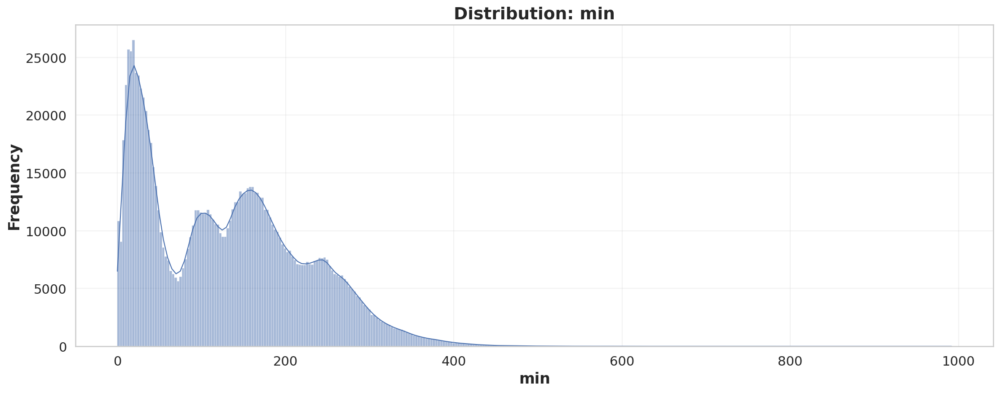

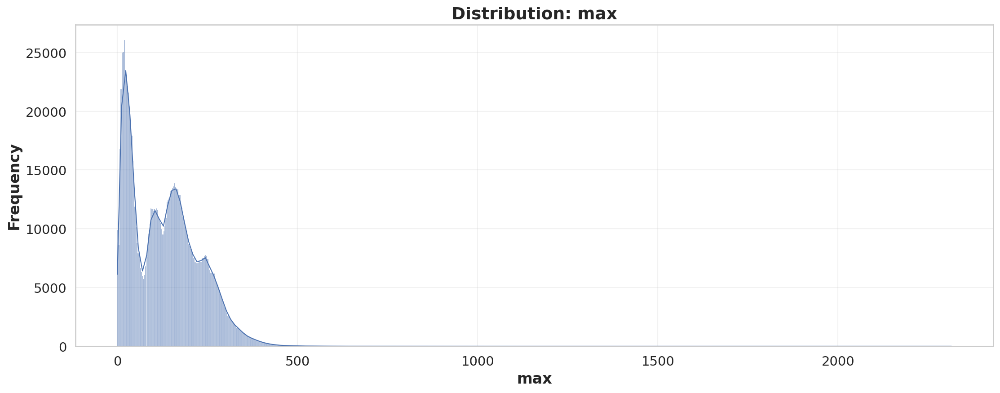

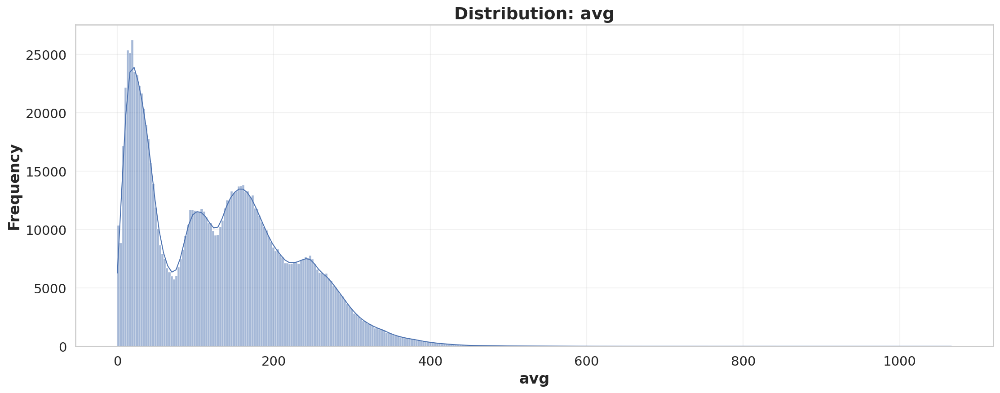

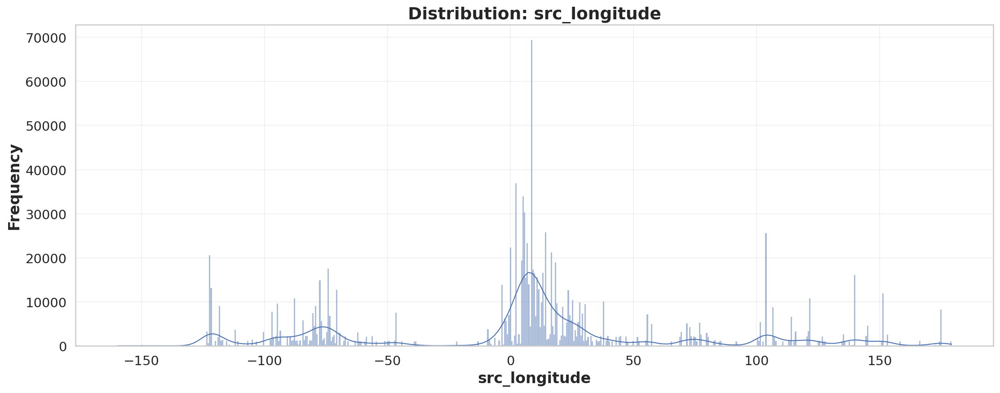

...

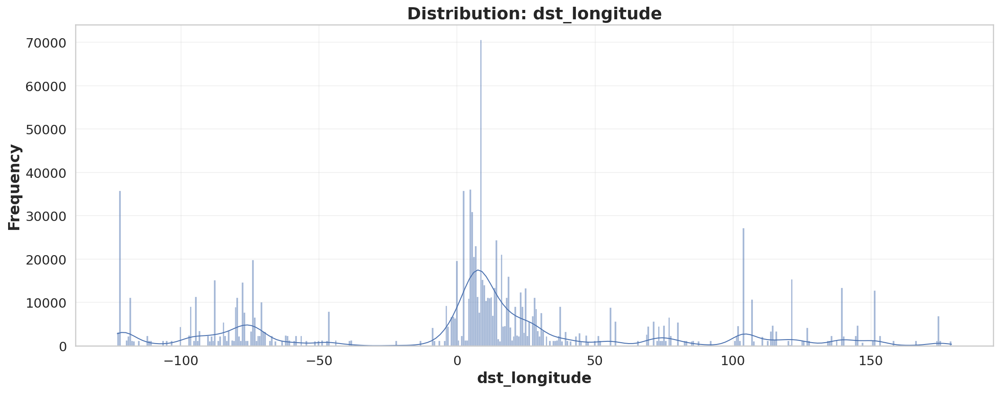

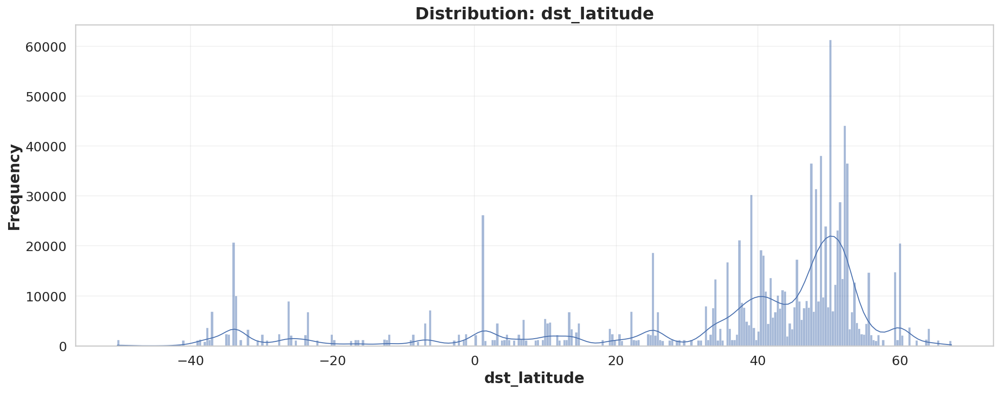

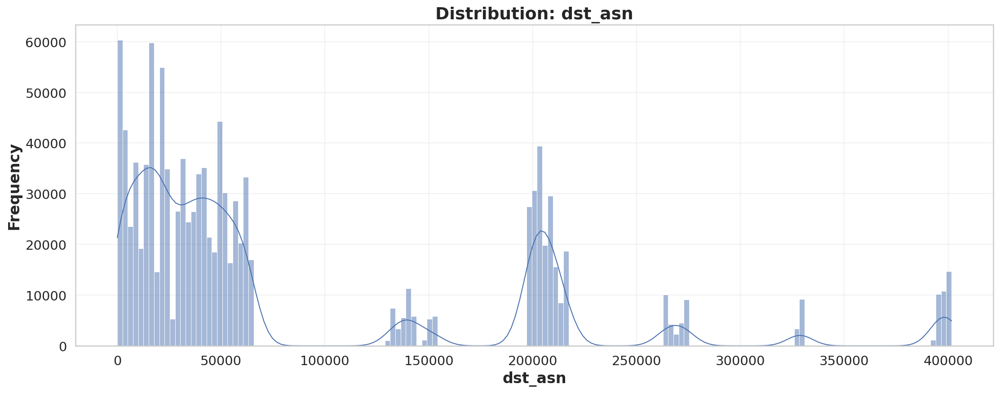

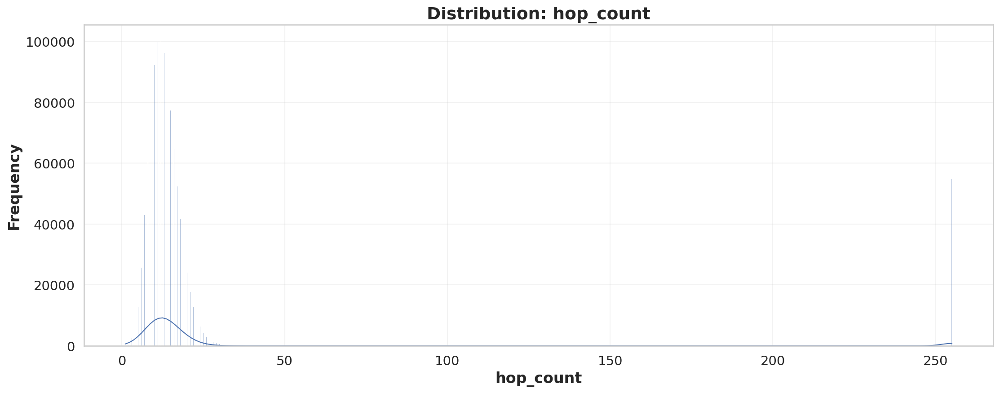

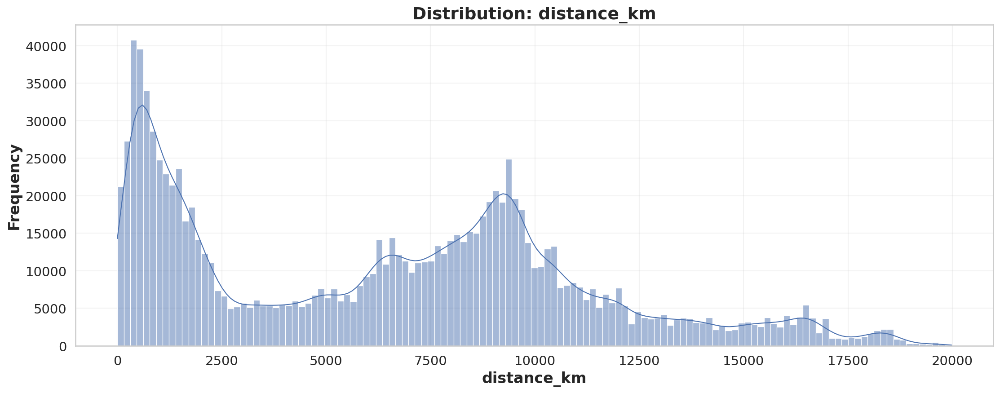



                    📊 Showing Count Plots...                     
Showing Count Plots for : sent, rcvd, src_continent, src_conn_type, src_is_mobile, src_is_cloud_provider, src_is_proxy, src_is_vpn, src_is_tor, src_is_tor_exit, dst_continent, dst_conn_type, dst_is_mobile, dst_is_cloud_provider, dst_is_proxy, dst_is_vpn, dst_is_tor, dst_is_tor_exit


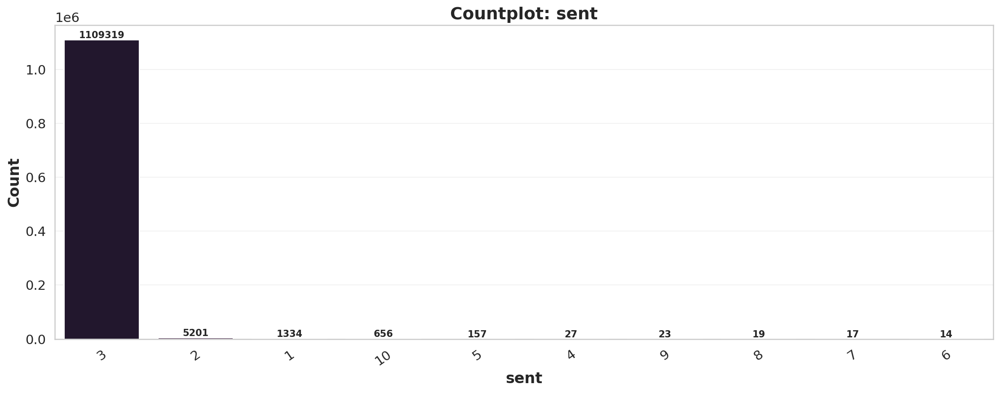

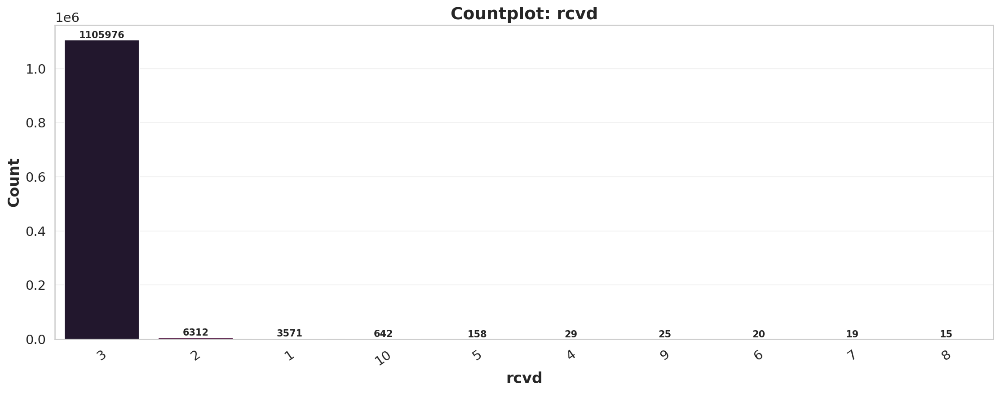

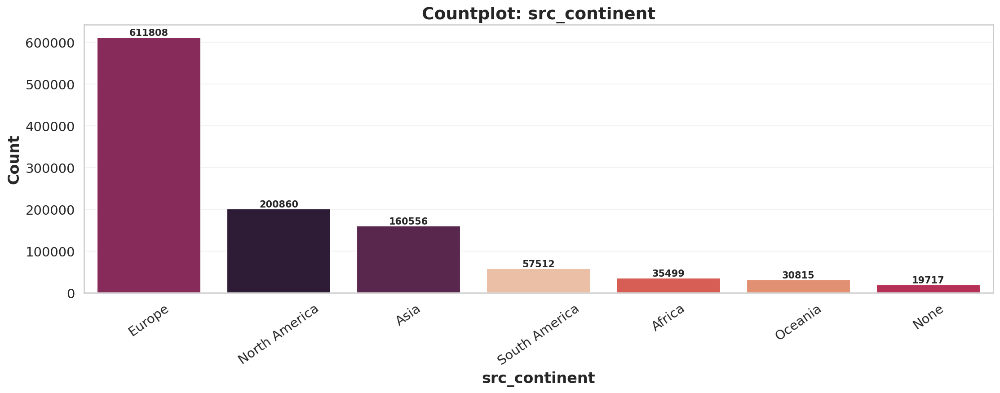

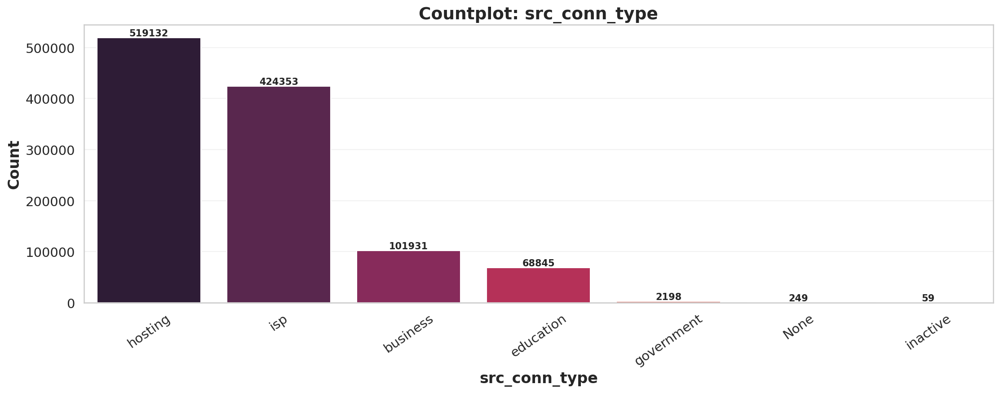

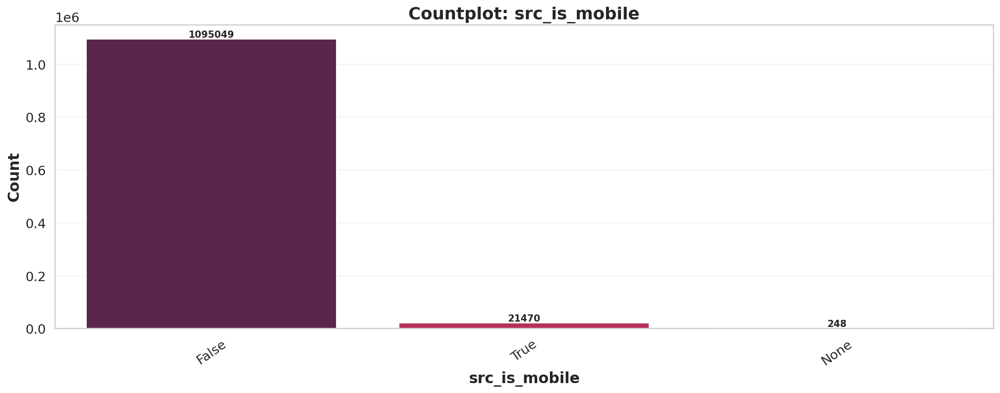

...

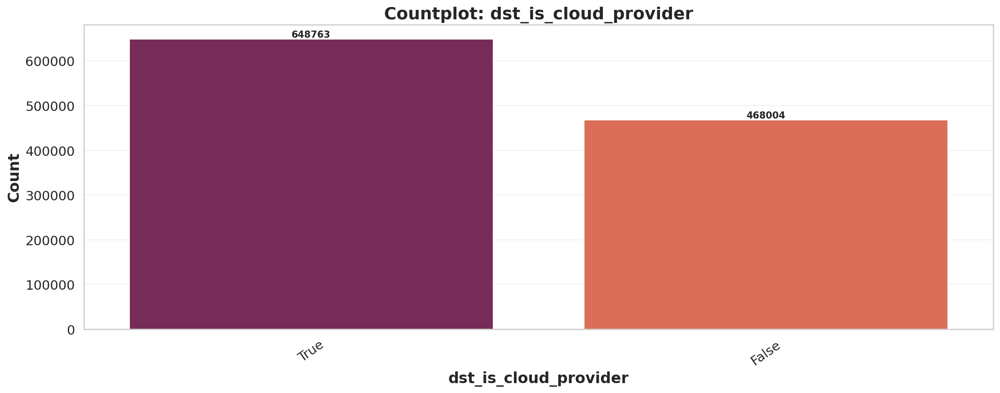

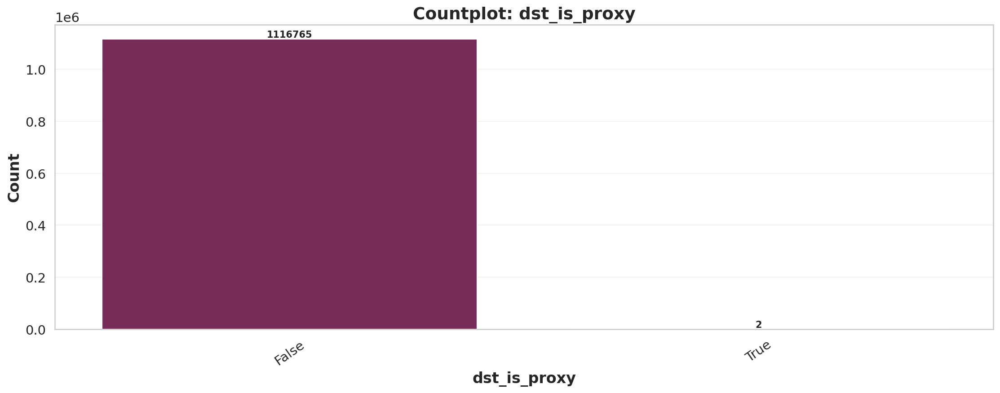

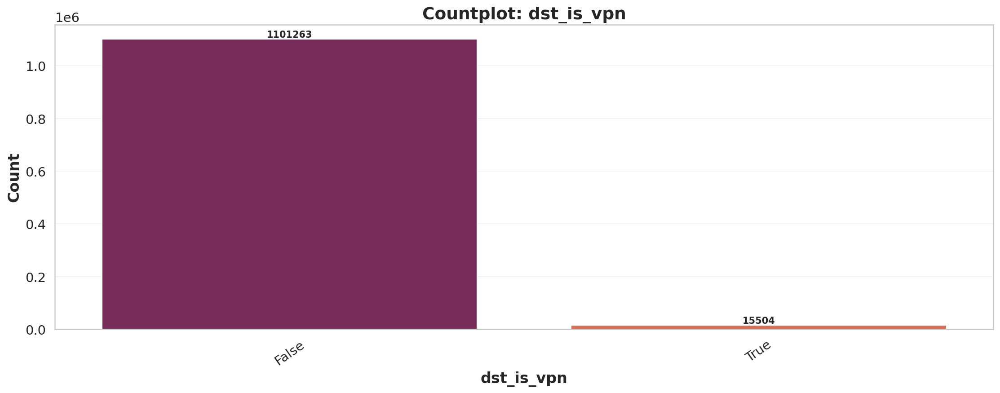

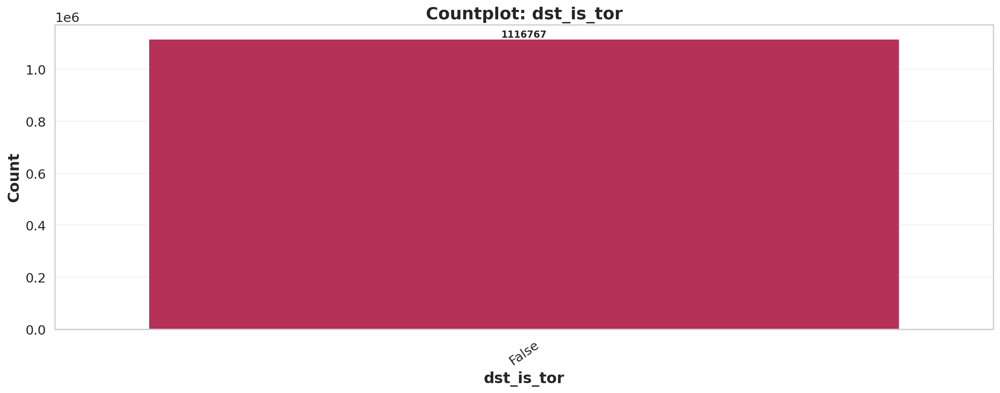

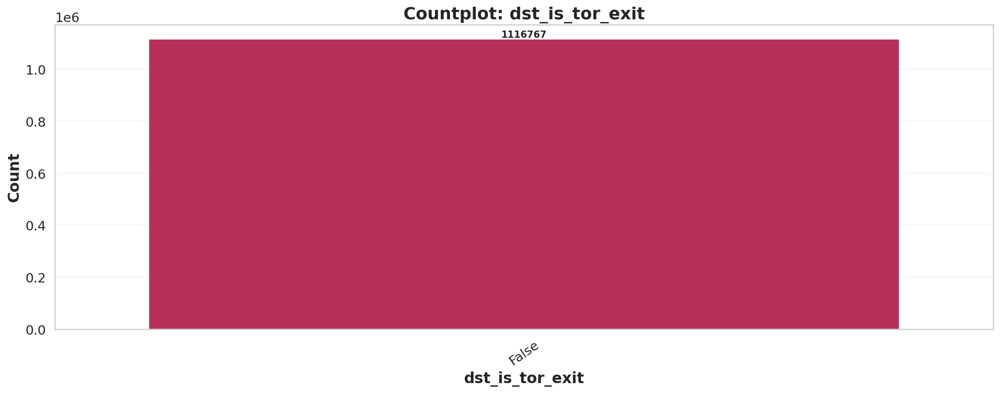



--------------------------------------------------------------------------------
                    📊 Showing Box and Whisker Plots...                     
--------------------------------------------------------------------------------
('Showing Box & Whisker Plots for : dup, min, max, avg, src_longitude, '
 'src_latitude, src_asn, dst_longitude, dst_latitude, dst_asn, hop_count, '
 'distance_km')


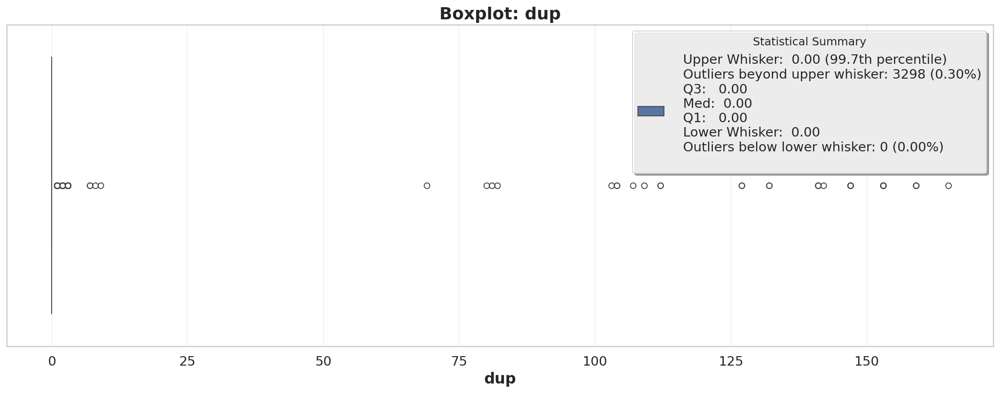

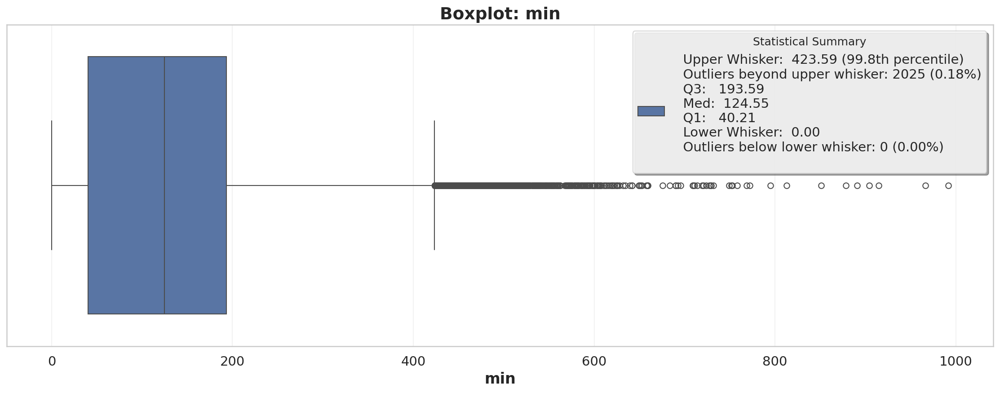

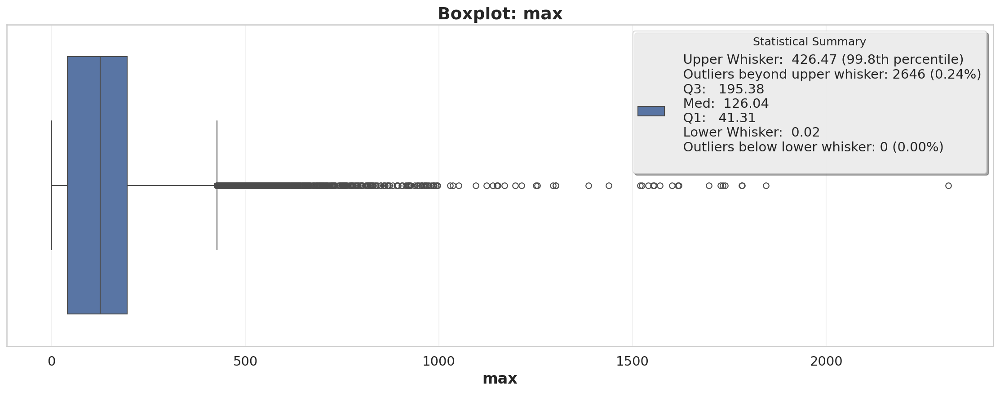

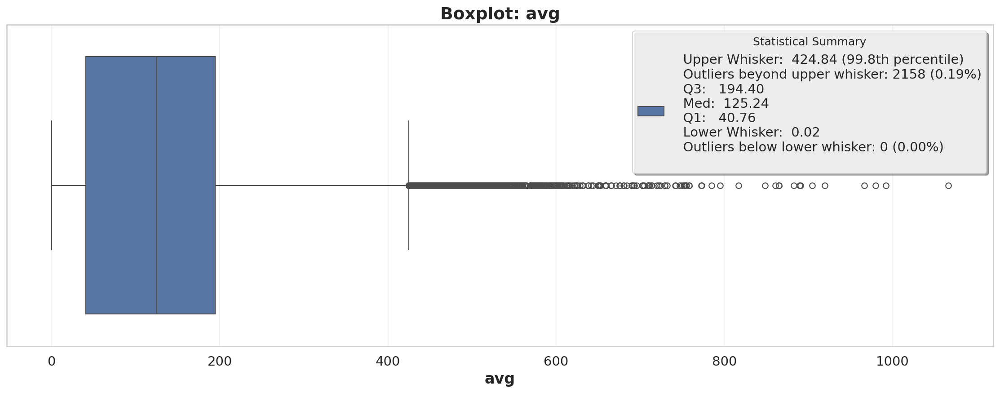

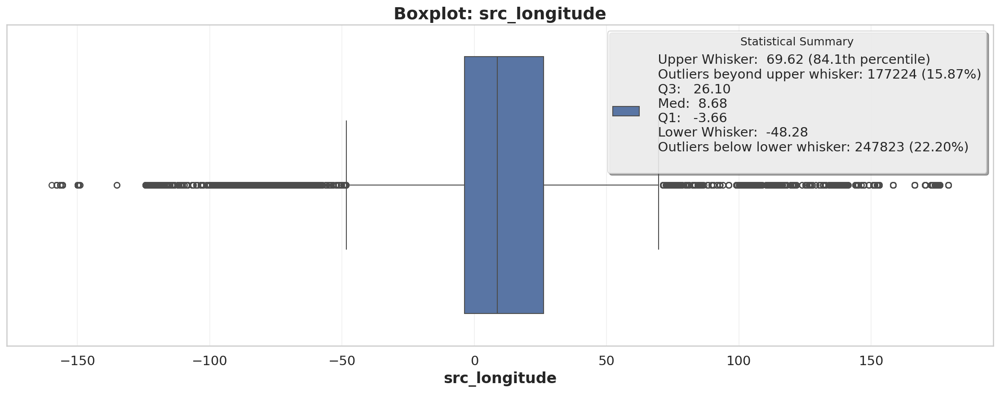

...

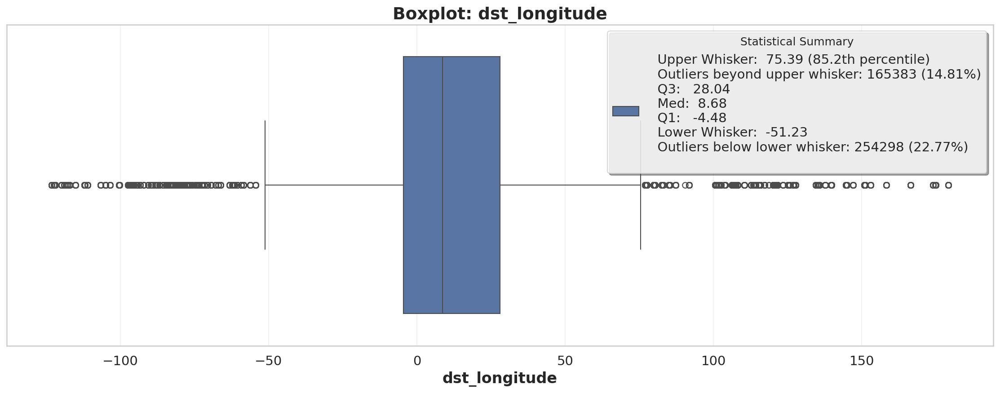

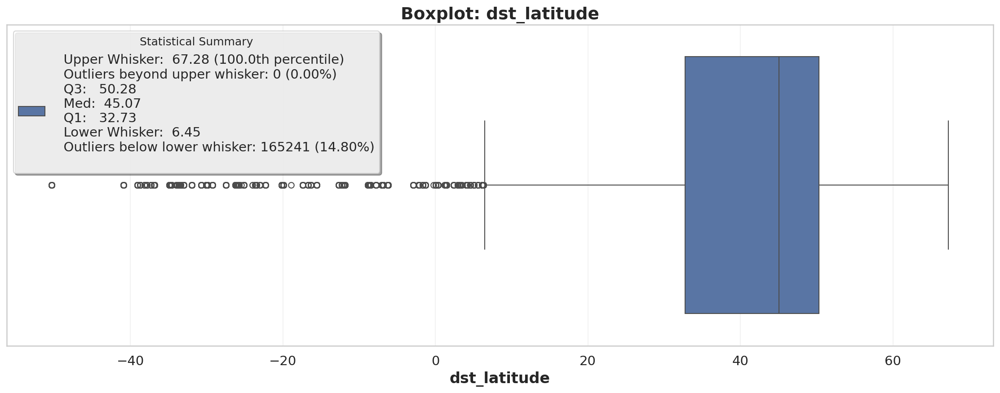

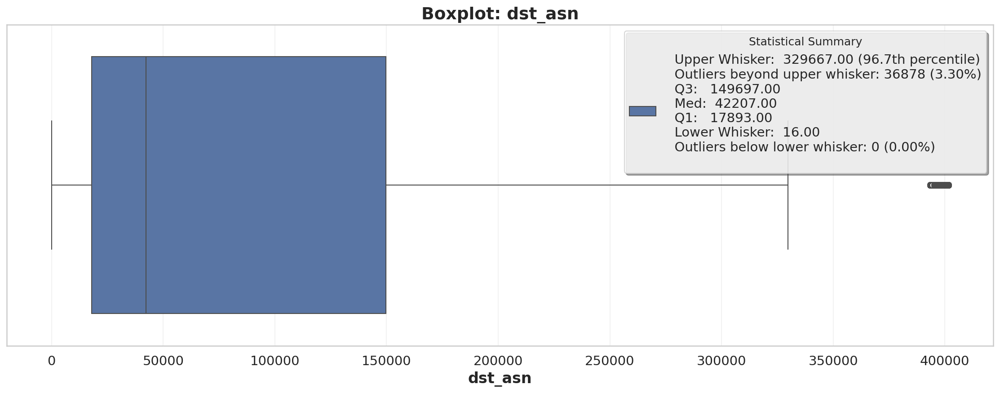

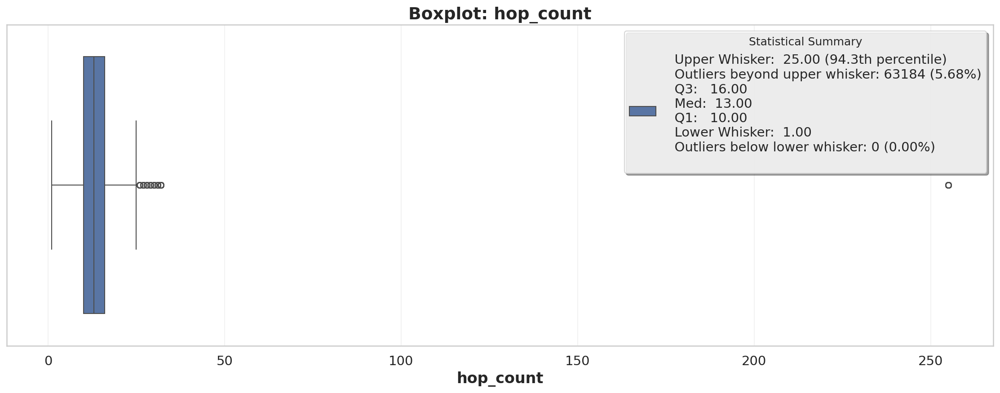

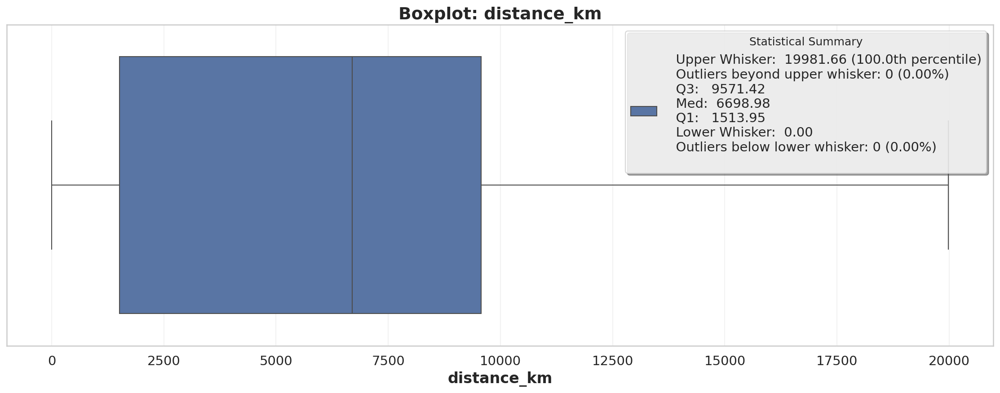



                    📈 Showing Target vs Feature Relationships...                     


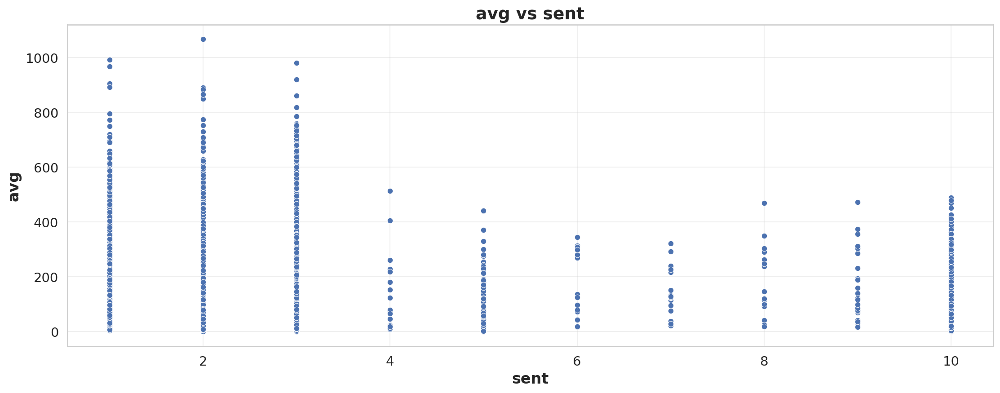

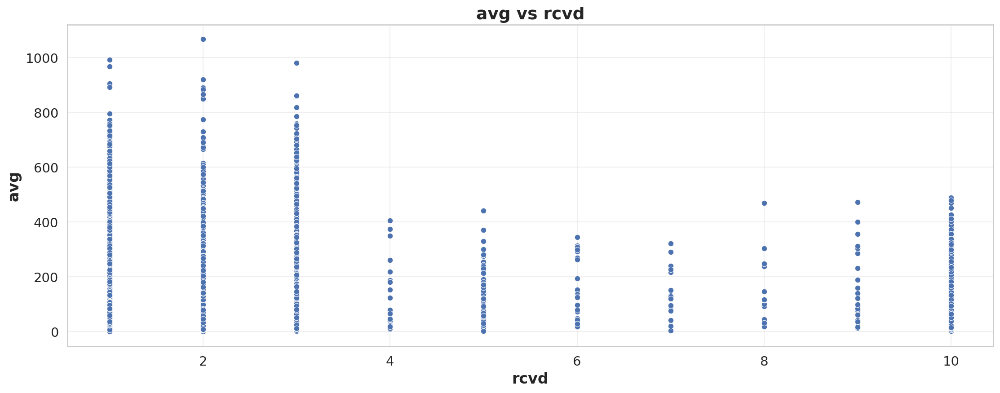

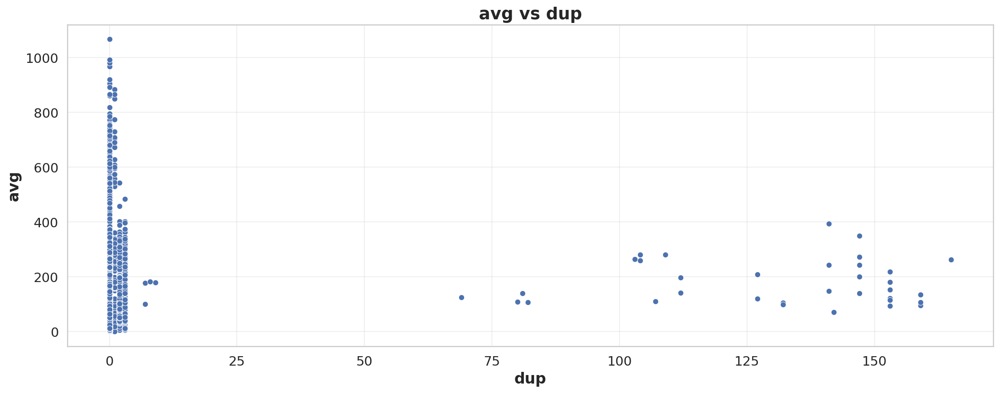

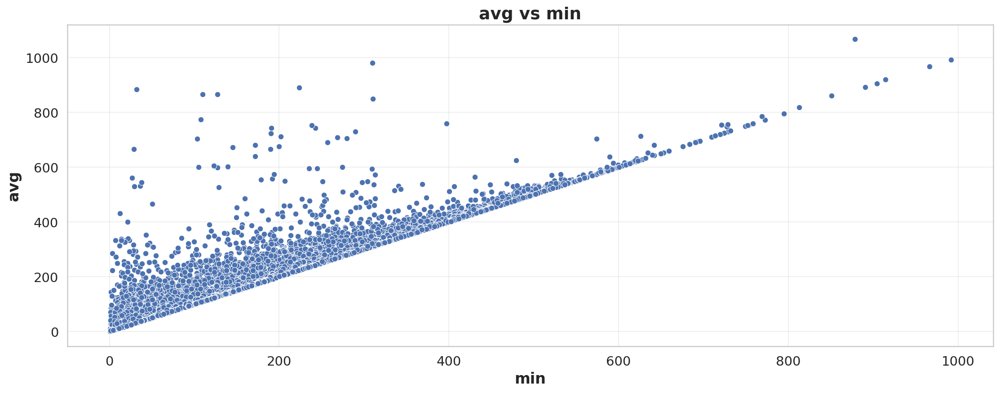

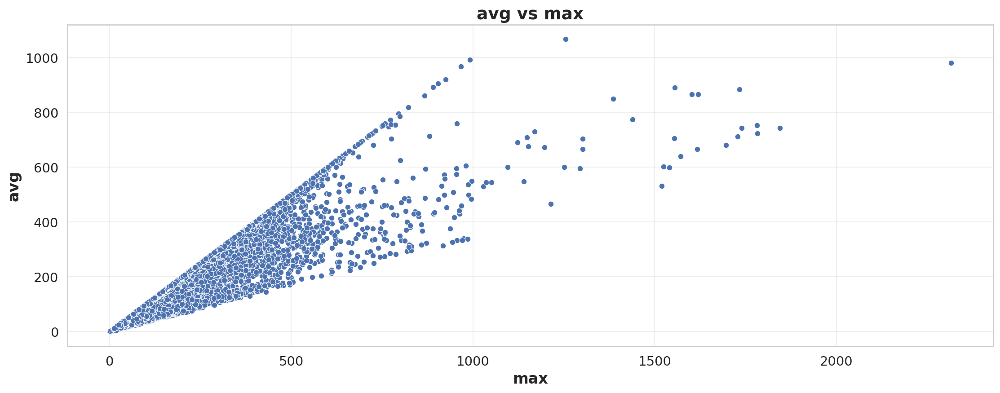

...

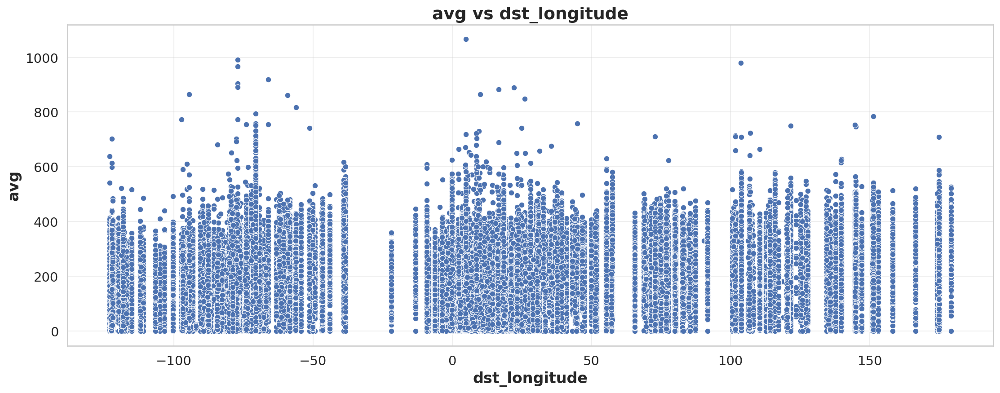

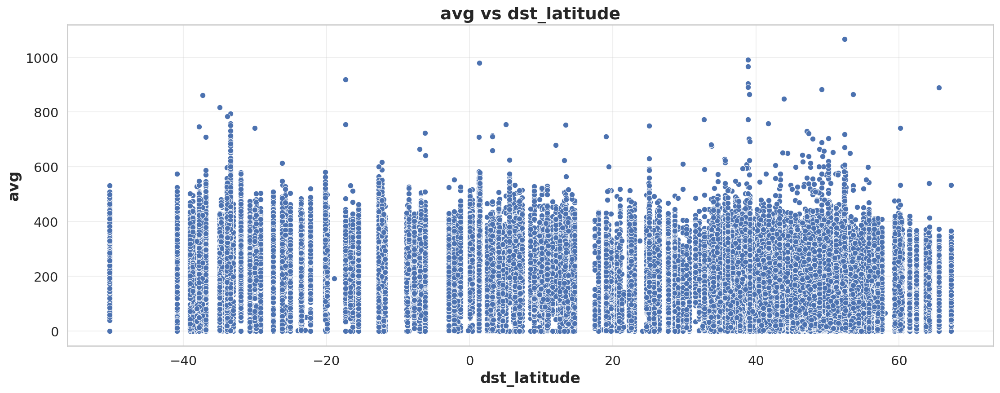

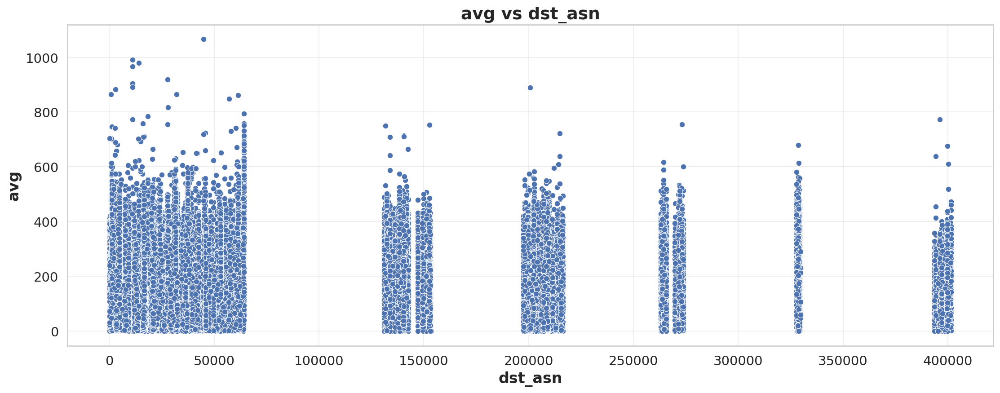

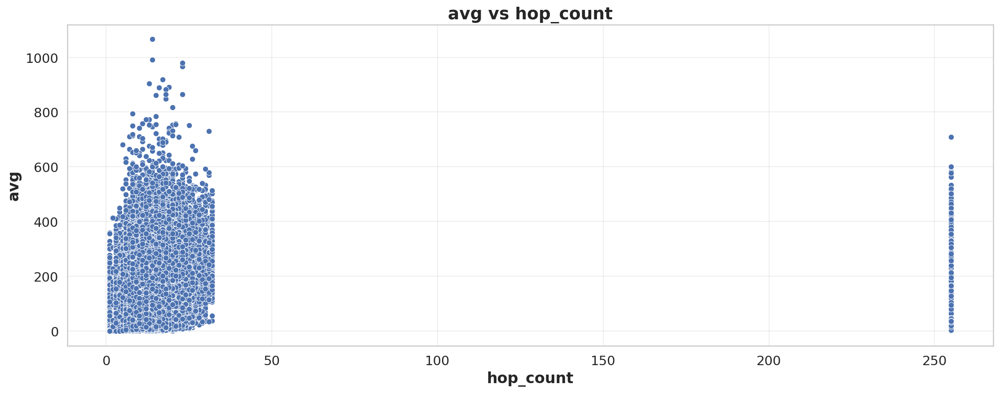

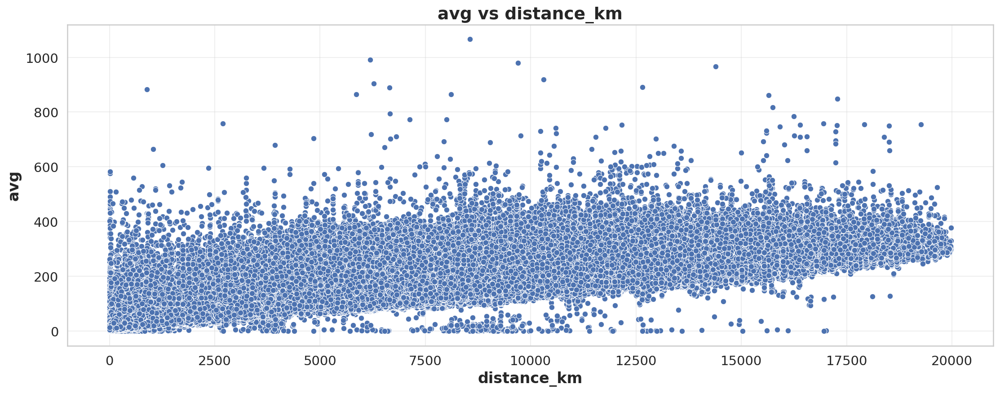



++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                    ✅ Task complete! All EDA steps have been executed.                    
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [3]:


eda = EDAPipeline(df = df, target='avg')
eda.run_all()


# Targeted EDA

As we have a general overview of the dataset, we will move into some targeted EDA. This is specific to the particular dataset and its "Business Domain" - the internet infratstucture. So we will be using domain specific business logic to create new features and perform various aggregations to get more insight.

- Proper typecast
- Remove NaNs
- Create domain specific features (based on various so called 'business logic') and perform various aggregations


Proper Typecasting

In [4]:
# Proper type cast

from df_typecast import typecast_dataframe

# the typecast configuration
typecast_config = {
    "int_cols": [],
    "float_cols": [],
    "str_cols": [],
    "bool_cols": ['src_is_mobile', 'src_is_cloud_provider', 'src_is_proxy', 'src_is_vpn', 'src_is_tor', 'src_is_tor_exit' ],
    "category_cols": ['src_asn', 'dst_asn'],
    "datetime_cols": []
}

# performing typecast
df_casted, typecast_report = typecast_dataframe(
    df = df,
    **typecast_config,
    errors = 'coerce',
    verbose=True
)

df_casted.info()

=== TYPE CAST REPORT ===

Dtype changes:

'  src_asn: float64 -> category'
'  src_is_mobile: object -> boolean'
'  src_is_cloud_provider: object -> boolean'
'  src_is_proxy: object -> boolean'
'  src_is_vpn: object -> boolean'
'  src_is_tor: object -> boolean'
'  src_is_tor_exit: object -> boolean'
'  dst_asn: float64 -> category'
Conversion failures:

'  src_is_mobile: None'
'  src_is_cloud_provider: None'
'  src_is_proxy: None'
'  src_is_vpn: None'
'  src_is_tor: None'
'  src_is_tor_exit: None'
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1116767 entries, 0 to 1116766
Data columns (total 41 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   timestamp              1116767 non-null  datetime64[us]
 1   src_addr               1116767 non-null  object        
 2   dst_addr               1116767 non-null  object        
 3   sent                   1116767 non-null  int64         
 4   rcvd          

Removing Nans

In [5]:
# remove na or nans
original_rows = df_casted.shape[0]
df_casted.dropna(inplace=True)
dropped_rows = original_rows - df_casted.shape[0]
dropped_percentage = round((dropped_rows / original_rows) * 100, 2)

print(f"Dropped {dropped_rows} rows due to missing values.  \n {dropped_percentage}% of  original data")
print(f"Remaining rows: {df_casted.shape[0]}")

# Keeping a copy of original and renaming the casted
original_df = df.copy()
df = df_casted.copy()

Dropped 43284 rows due to missing values.  
 3.88% of  original data
Remaining rows: 1073483


## Data Validation - Physical Limit vs. Network Topology

**Physical Fiber Limit**

 The refractive index ($n$) of the silica glass used in modern single-mode fiber optic cables (such as the standard ITU-T G.652 fiber used in long-haul networks) is empirically measured to be approximately $1.467$ at a transmission wavelength of $1550 \text{ nm}$.

The speed of light in a vacuum ($299,792 \text{ km/s}$) divided by $1.467$ yields a propagation speed of roughly $204,357 \text{ km/s}$ inside the core of the fiber. Since pings measure round-trip time, the light must travel the distance twice.

This yields a factor of :

$$\frac{204,357 \text{ km/s}}{2} = 102,178.5 \text{ km/s} \approx 102.18 \text{ km/ms}$$


**Challanges with Real Networking Systems**

*1. The Great Circle Distance Asymmetry (Circuity Factor)*

Geographic coordinates only allow us to calculate the Great Circle Distance (the absolute straight-line distance over the earth's curvature). Real fiber cables, however, do not run in straight lines; they follow rights-of-way, highways, railway tracks, and undersea topography.

Academic studies on internet topology, such as those published by **USENIX and the ACM Internet Measurement Conference (IMC)**, frequently calculate this discrepancy, known as **the circuity factor**.

A foundational paper in this domain, “Towards Geography-Aware Network Systems” (by quantitative networking researchers), analyzed global internet paths and concluded that real-world fiber routing paths are typically $1.2\times$ to $1.5\times$ longer than the straight-line geographic distance between endpoints.

The Application: A multiplier of $1.3$ ($30\%$ path inflation) is chosen as a standard, conservative mid-point representation for regional and transcontinental routing.

*2. Serialization and Processing Overhead*

Even if light traveled in a perfectly straight line, latency is introduced every time a packet hits a physical piece of routing equipment. Serialization Delay, Processing and Queuing Delay.

In a typical multi-hop path, the accumulation of these microseconds across the operating systems of the host machines and intermediate network switches/routers adds a baseline overhead. A fixed addition of $+2 \text{ ms}$ serves as a floor to account for minimal, non-congested hardware processing time.



In [6]:
# The approx. Physical Limit of Fibers
light_speed_vac = 299_792   # m/s
fiber_ri =  1.467           # empirical measurement of ITU-T G.652 fiber@1550 nm,  used in long-haul networks
scaling_factor = (light_speed_vac/fiber_ri)/(1000*2)           # km/ms


# Challanges with Real Networking Systems
circuitry_factor = 1.3       # Application: A multiplier of 1.3 (30% path inflation) is chosen
processing_delay = 2         # account for minimal, non-congested hardware processing time

This is a nice guardrail for *data validation* - the points below the redline (physical rtt limit) are invalid measurements. The possible explanation could be some sensor error, or the src-dst pairs are using mock locations.

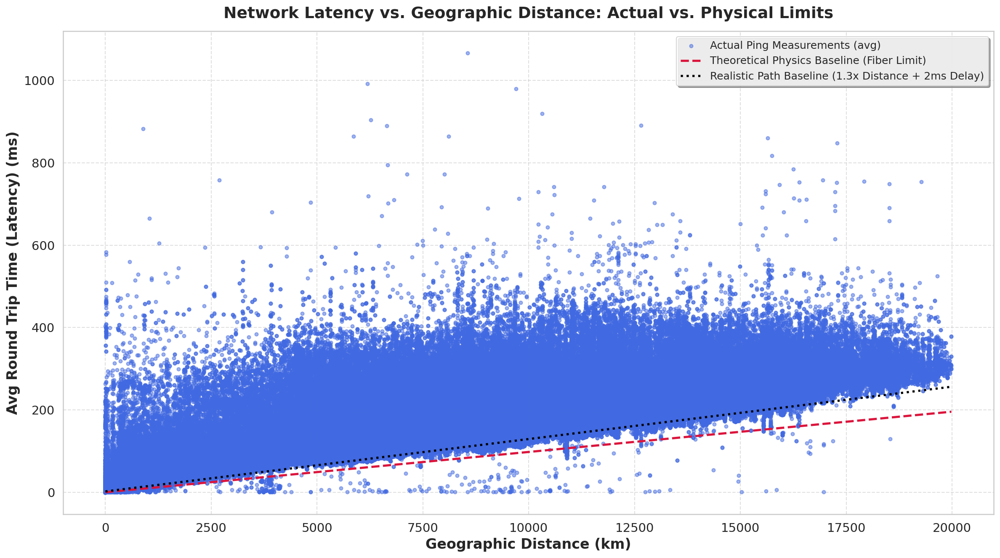

In [7]:
# 1. Calculate the absolute physical floor for RTT
df['physics_baseline_rtt'] = df['distance_km'] / scaling_factor
df['realistic_baseline_rtt'] = (df['physics_baseline_rtt']  * circuitry_factor) + processing_delay

# Sort the dataframe by distance to ensure the baseline lines draw smoothly
df_sorted = df.sort_values(by='distance_km')

# Set up the plot using subplots
fig, ax = plt.subplots(figsize=(16, 9))

# Scatter plot of your actual dataset rows
ax.scatter(df['distance_km'], df['avg'], alpha=0.5, color='royalblue', label='Actual Ping Measurements (avg)', s=15)

# Plot the absolute theoretical physics baseline
ax.plot(df_sorted['distance_km'], df_sorted['physics_baseline_rtt'],
        color='crimson', linestyle='--', linewidth=2.5, label='Theoretical Physics Baseline (Fiber Limit)')

# Plot a realistic baseline
ax.plot(df_sorted['distance_km'], df_sorted['realistic_baseline_rtt'],
        color='black', linestyle=':', linewidth=2.5, label='Realistic Path Baseline (1.3x Distance + 2ms Delay)')

# Labeling and formatting
ax.set_title('Network Latency vs. Geographic Distance: Actual vs. Physical Limits',pad=15)
ax.set_xlabel('Geographic Distance (km)')
ax.set_ylabel('Avg Round Trip Time (Latency) (ms)')
ax.grid(True, linestyle='--', alpha=0.6)
ax.legend(loc='best')

plt.tight_layout()

In [8]:
# num of rows where df['avg'] < df['physics_baseline_rtt']
df[df['avg'] < df['physics_baseline_rtt']].shape[0]

1260

In [9]:
# num of rows where df['avg'] < df['realistic_baseline_rtt']
df[df['avg'] < df['realistic_baseline_rtt']].shape[0]

25120

From now on, we will only consider those valid measurements

In [10]:
# dropping the rows below the physics_baseline limit
df.query('avg >= physics_baseline_rtt', inplace=True)

df.info()

# see the percentage
remaining_row_frac = round(df.shape[0] / original_rows,3)

print(f"\nRemaining rows after data validation:  {df.shape[0]}")
print(f"\n{remaining_row_frac*100} % of the original dataset")

<class 'pandas.core.frame.DataFrame'>
Index: 1072223 entries, 0 to 1113118
Data columns (total 43 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   timestamp               1072223 non-null  datetime64[us]
 1   src_addr                1072223 non-null  object        
 2   dst_addr                1072223 non-null  object        
 3   sent                    1072223 non-null  int64         
 4   rcvd                    1072223 non-null  int64         
 5   dup                     1072223 non-null  int64         
 6   min                     1072223 non-null  float64       
 7   max                     1072223 non-null  float64       
 8   avg                     1072223 non-null  float64       
 9   src_continent           1072223 non-null  object        
 10  src_country             1072223 non-null  object        
 11  src_longitude           1072223 non-null  float64       
 12  src_latitude       

## Some Targeted EDA


- Hotspot Analysis: Group by src_country or src_continent to find regions with disproportionately high average latencies or packet loss (sent - rcvd).

- The "Anonymity Penalty": Compare latency distributions (avg) across different boolean flags. Create box plots grouping data by src_is_vpn, src_is_tor, or src_is_cloud_provider. This quantifies the exact routing overhead introduced by proxies and overlay networks.

- Connection Type Profiles: Analyze how src_conn_type (e.g., cellular vs. residential broadband) impacts both the baseline latency (min) and the jitter or variance (max - min).

**Latency and Loss Metrics**

Packet Loss Rate: Raw counts are hard to normalize.
$$\text{loss rate} = \frac{\text{sent} - \text{rcvd}}{\text{sent}}$$

Jitter (Latency Variance): High average latency is bad, but unpredictable latency is worse for applications.

$$\text{jitter} = \text{max} - \text{min}$$

Queueing Delay Estimate: min latency often represents the theoretical propagation delay of the path without traffic.

$$\text{estimated queueing delay} = \text{avg} - \text{min}$$

Risk/Infrastructure Profiles

**Source Proxy Count:**

Sum the boolean flags for the source (src_is_vpn + src_is_proxy + src_is_tor) into a single integer src_anonymity_score.


### Domain Specific Features

In [11]:
#packet loss rate
df['packet_loss_rate'] = (df['sent'] - df['rcvd']) / df['sent']

# jitter
df['jitter'] = df['max'] - df['min']

# estimated queing delay
df['estimated_queueing_delay'] = df['avg'] - df['min']

# source proxy count
df['src_anonymity_score'] = df['src_is_vpn'] + df['src_is_proxy'] + df['src_is_tor']


df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1072223 entries, 0 to 1113118
Data columns (total 47 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   timestamp                 1072223 non-null  datetime64[us]
 1   src_addr                  1072223 non-null  object        
 2   dst_addr                  1072223 non-null  object        
 3   sent                      1072223 non-null  int64         
 4   rcvd                      1072223 non-null  int64         
 5   dup                       1072223 non-null  int64         
 6   min                       1072223 non-null  float64       
 7   max                       1072223 non-null  float64       
 8   avg                       1072223 non-null  float64       
 9   src_continent             1072223 non-null  object        
 10  src_country               1072223 non-null  object        
 11  src_longitude             1072223 non-null  float64    

**Performance metrics across continents**

In [12]:
# performance metric across continents
continent_metrics = df.groupby('src_continent').agg({
    'packet_loss_rate': 'mean',
    'jitter': 'median',
    'estimated_queueing_delay': 'median'
}).sort_values(by='packet_loss_rate', ascending=True)

# rename and process df
continent_metrics['packet_loss_rate'] = continent_metrics['packet_loss_rate'] * 100

continent_metrics.rename(columns={
    'packet_loss_rate': 'avg_packet_loss_rate(%)',
    'jitter': 'median_jitter(ms)',
    'estimated_queueing_delay': 'median_estimated_queueing_delay(ms)'
}, inplace=True)


print(continent_metrics)



               avg_packet_loss_rate(%)  median_jitter(ms)  \
src_continent                                               
North America                 0.133036           0.211811   
Europe                        0.154870           0.202828   
Oceania                       0.171455           0.234636   
Africa                        0.174939           0.199017   
Asia                          0.298172           0.229444   
South America                 0.385410           0.253637   

               median_estimated_queueing_delay(ms)  
src_continent                                       
North America                             0.101932  
Europe                                    0.097531  
Oceania                                   0.108988  
Africa                                    0.096229  
Asia                                      0.109005  
South America                             0.121183  


Avg packet loss across source continents

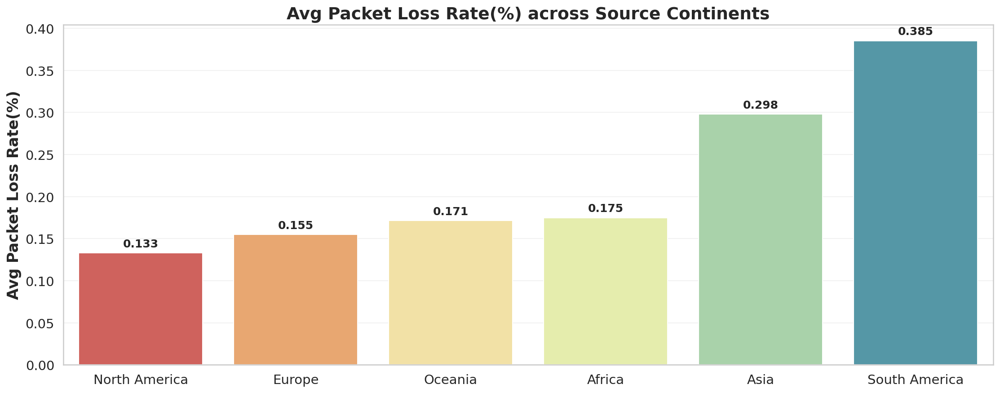

In [13]:
palette = sns.color_palette("Spectral")
'''
# avg packet loss rate
sns.barplot(x=continent_metrics.index, y='avg_packet_loss_rate(%)', data=continent_metrics,
            palette= palette, hue = continent_metrics.index, legend = False)
'''

# annotate the bars with values
ax = sns.barplot(x=continent_metrics.index, y='avg_packet_loss_rate(%)', data=continent_metrics,
            palette= palette, hue = continent_metrics.index, legend = False)
for container in ax.containers:
    ax.bar_label(container, fmt ='%0.3f', fontsize = 12, weight = "bold", label_type = "edge", padding = 4)

plt.title("Avg Packet Loss Rate(%) across Source Continents")
plt.xlabel("")
plt.ylabel("Avg Packet Loss Rate(%)")
plt.tight_layout()
plt.show()


Distribution of avg rtt across source continents

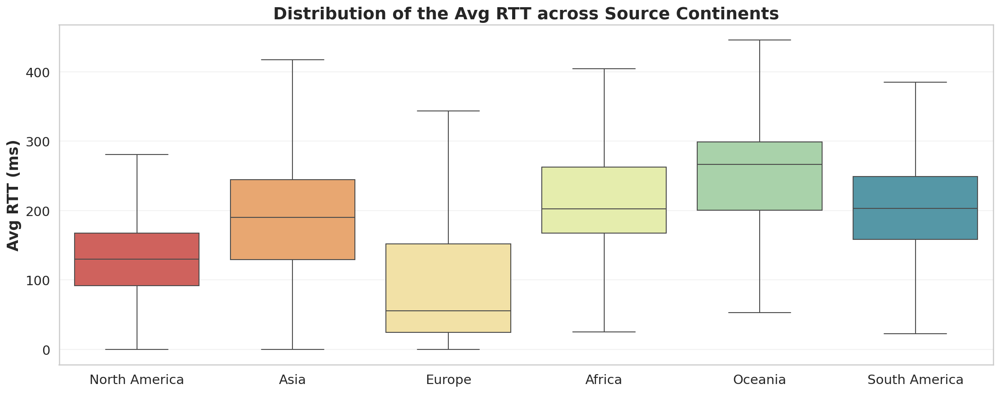

In [14]:
sns.boxplot(x='src_continent', y='avg', data=df, palette=palette, showfliers=False, hue = 'src_continent', legend = False)
plt.title("Distribution of the Avg RTT across Source Continents")
plt.xlabel("")
plt.ylabel("Avg RTT (ms)")
plt.tight_layout()
plt.show()

Distribution of rtt jitters across source continents

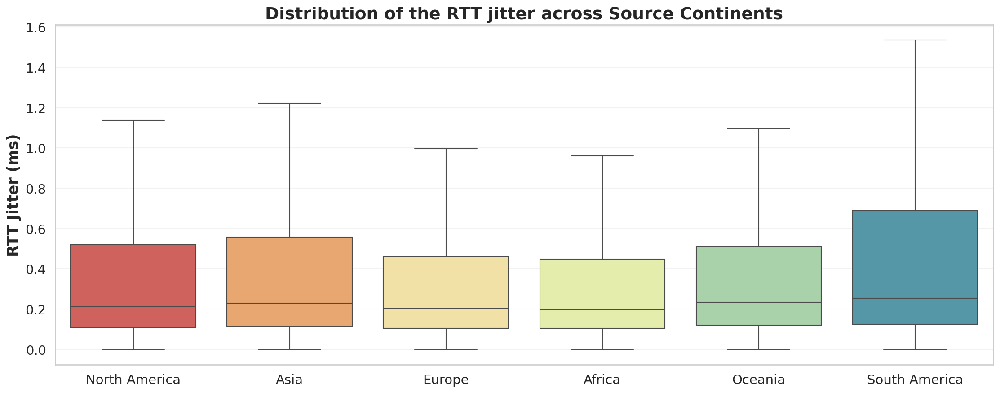

In [15]:
sns.boxplot(x='src_continent', y='jitter', data=df, palette = palette, showfliers=False, hue = 'src_continent', legend = False)
plt.title("Distribution of the RTT jitter across Source Continents")
plt.xlabel("")
plt.ylabel("RTT Jitter (ms)")
plt.tight_layout()
plt.show()

Distribution of queueing delay across source continents

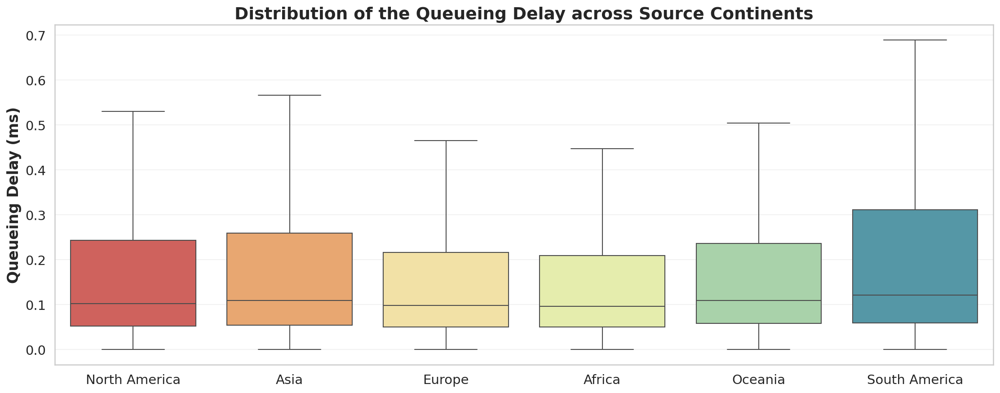

In [16]:
sns.boxplot(x='src_continent', y='estimated_queueing_delay', data=df, palette= palette,
            showfliers=False, hue = 'src_continent', legend = False)
plt.title("Distribution of the Queueing Delay across Source Continents")
plt.xlabel("")
plt.ylabel("Queueing Delay (ms)")
plt.tight_layout()
plt.show()



Routing Efficiency Index by looking at the ratio of latency to distance.

In [17]:
# Avoid division by zero for identical src/dst locations
df['routing_inefficiency'] = np.where(
    df['distance_km'] > 10,
    df['min'] / df['distance_km'],
    np.nan
)

# Identify the worst offending source countries
bad_routing = (
    df.groupby('src_country')['routing_inefficiency']
    .agg(['median', 'count'])
    .query('count > 100')  # Filter out low-sample noise
    .sort_values(by='median', ascending=False)
    .head(10)
)
print("Top 10 Countries with Most Inefficient Routing:")
print(bad_routing)

Top 10 Countries with Most Inefficient Routing:
               median  count
src_country                 
Lebanon      0.033461    964
Ghana        0.031551    979
South Korea  0.030836   4006
Nigeria      0.029710   2026
Nepal        0.028709   1104
Uganda       0.027562   1126
Cameroon     0.027240    972
Slovenia     0.026921   2921
Kenya        0.026541   3086
Moldova      0.026419   1264


**ASN and Provider Concentration Analysis**

A few massive Autonomous Systems (like Tier 1 ISPs or major cloud providers) handle the vast majority of internet traffic. Identifying dominant ASNs and comparing their performance helps isolate whether performance bottlenecks are systemic or limited to specific providers.

In [18]:
# Identify top 5 source ASNs
top_asns = df['src_asn'].value_counts().head(5).index.tolist()

# Filter and analyze performance across top ASNs
asn_perf = (
    df[df['src_asn'].isin(top_asns)]
    .groupby('src_asn', observed=True)
    .agg({
        'avg': 'median',
        'packet_loss_rate': 'mean',
        'hop_count': 'median'
    })
)
print("Performance of Top 5 Source ASNs:")
print(asn_perf)

Performance of Top 5 Source ASNs:
                 avg  packet_loss_rate  hop_count
src_asn                                          
16552.0   156.458842          0.001249       11.0
20473.0   133.942153          0.001366       15.0
31713.0   206.522343          0.001371       11.0
48503.0   118.985079          0.001275       13.0
202422.0  127.823577          0.001188       13.0


 **Congestion Matrix (Queueing Delay Heatmap)**

 The estimated_queueing_delay ($avg - min$) captures transient bufferbloat and network congestion. Mapping this across source and destination continents isolates exactly which international transits are choked.

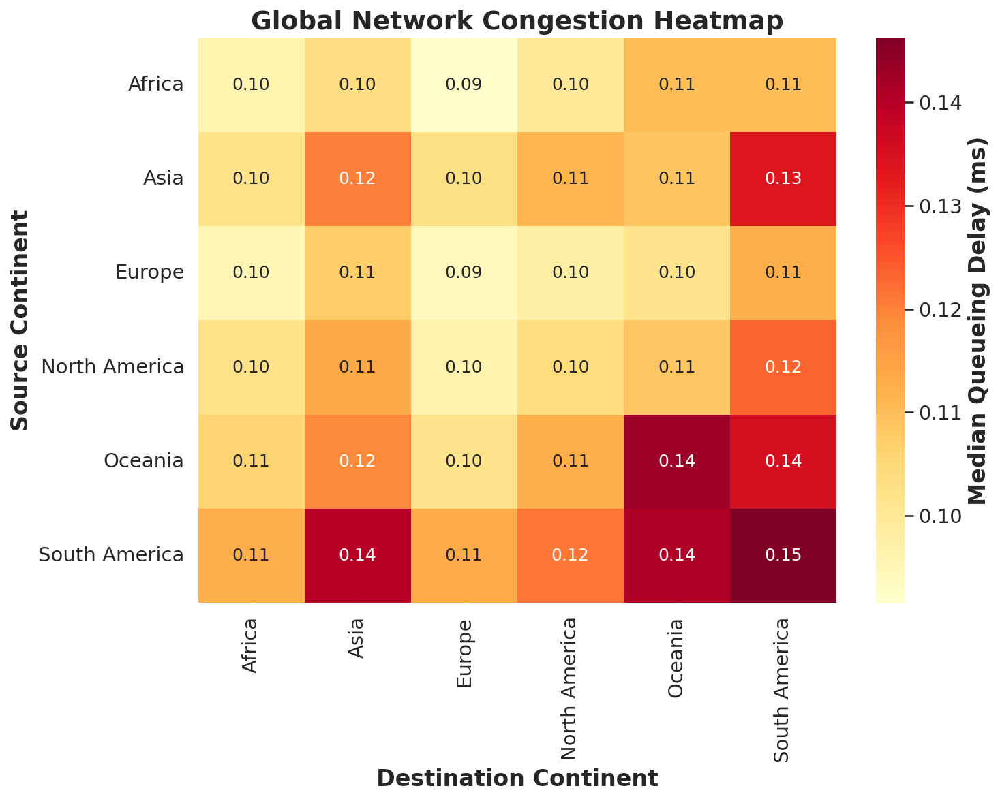

In [19]:
# Pivot table for median queueing delay across regions
congestion_matrix = df.pivot_table(
    index='src_continent',
    columns='dst_continent',
    values='estimated_queueing_delay',
    aggfunc='median'
)

plt.figure(figsize=(10, 8))
sns.heatmap(
    congestion_matrix,
    annot=True,
    cmap='YlOrRd',
    fmt='.2f',
    cbar_kws={'label': 'Median Queueing Delay (ms)'}
)
plt.title('Global Network Congestion Heatmap')
plt.xlabel('Destination Continent')
plt.ylabel('Source Continent')
plt.tight_layout()
plt.show()